# TS8

# Primera Parte

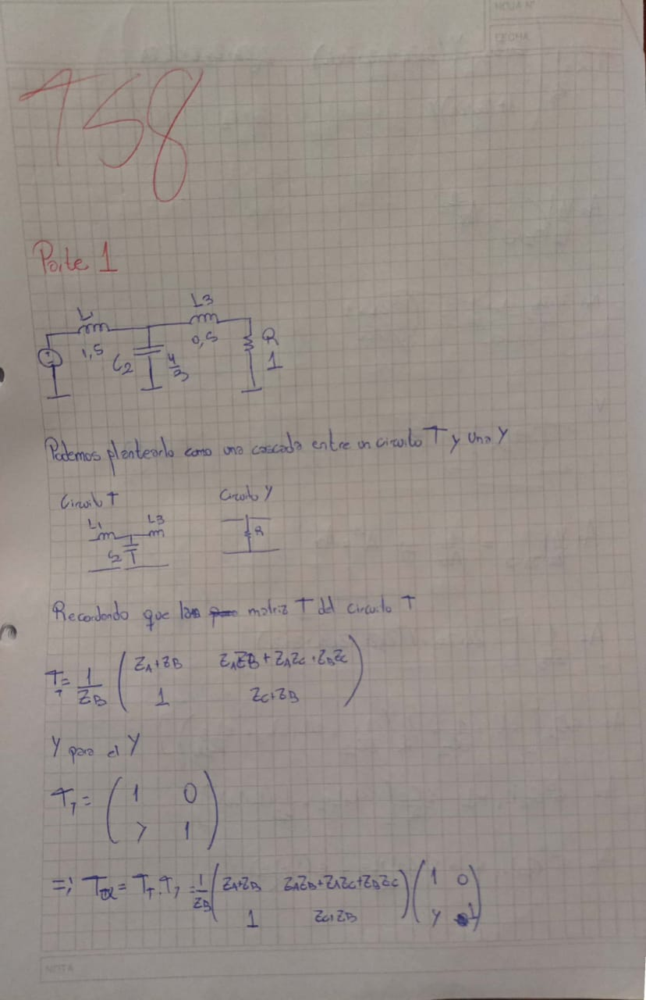
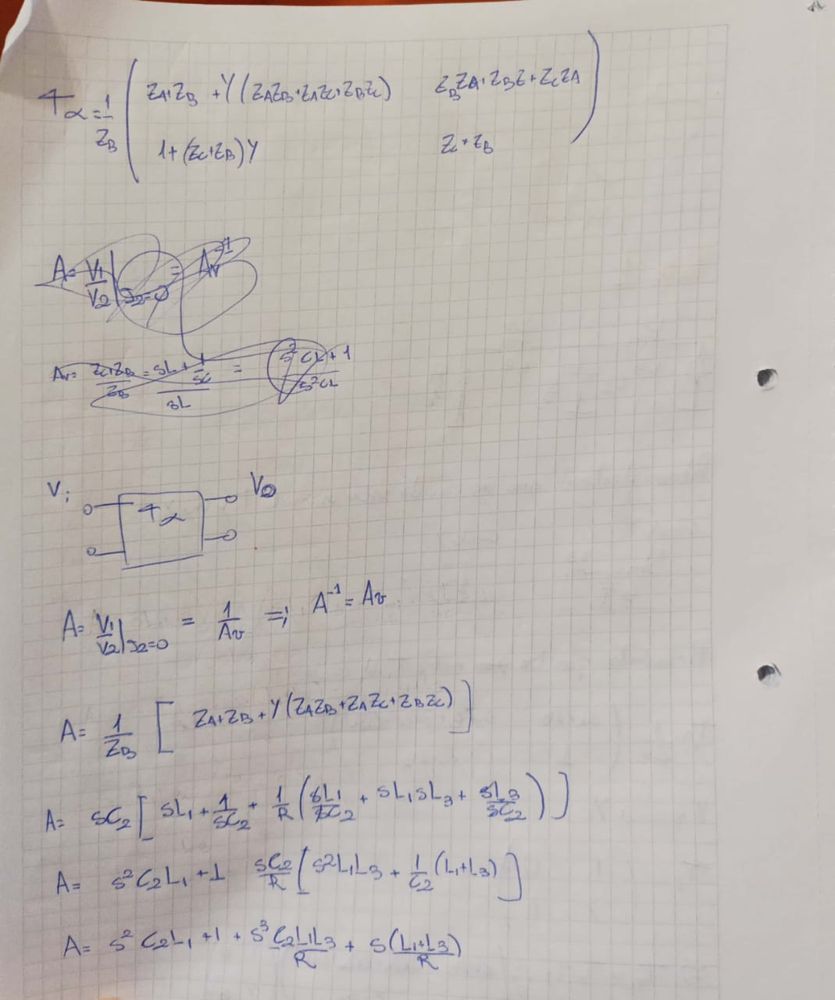
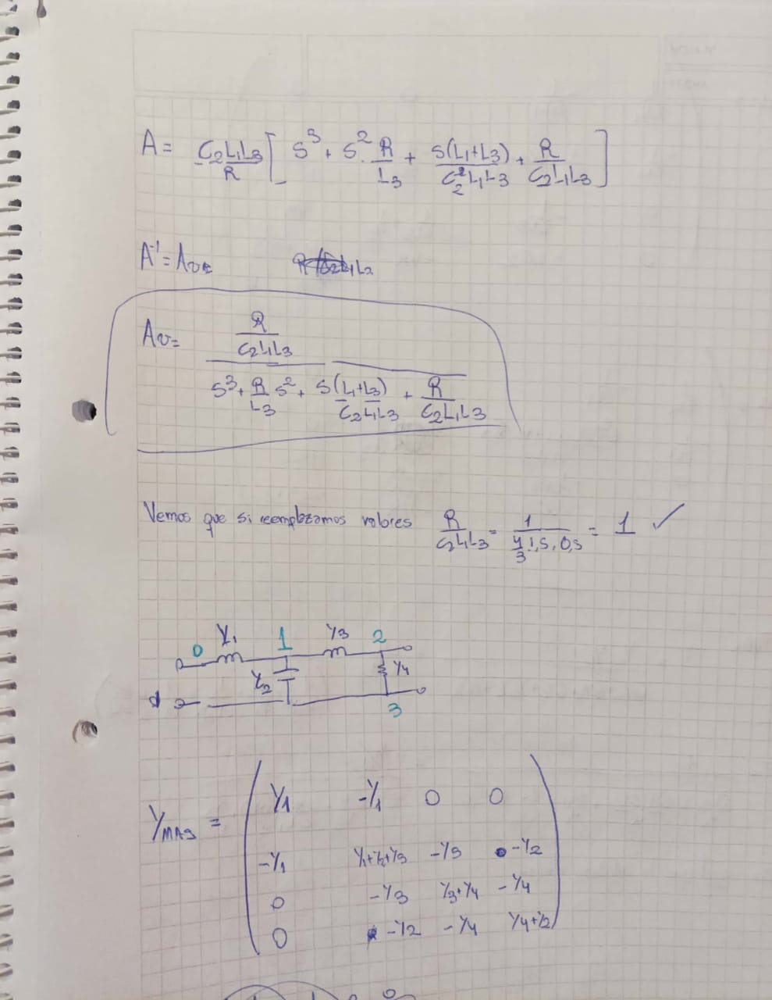
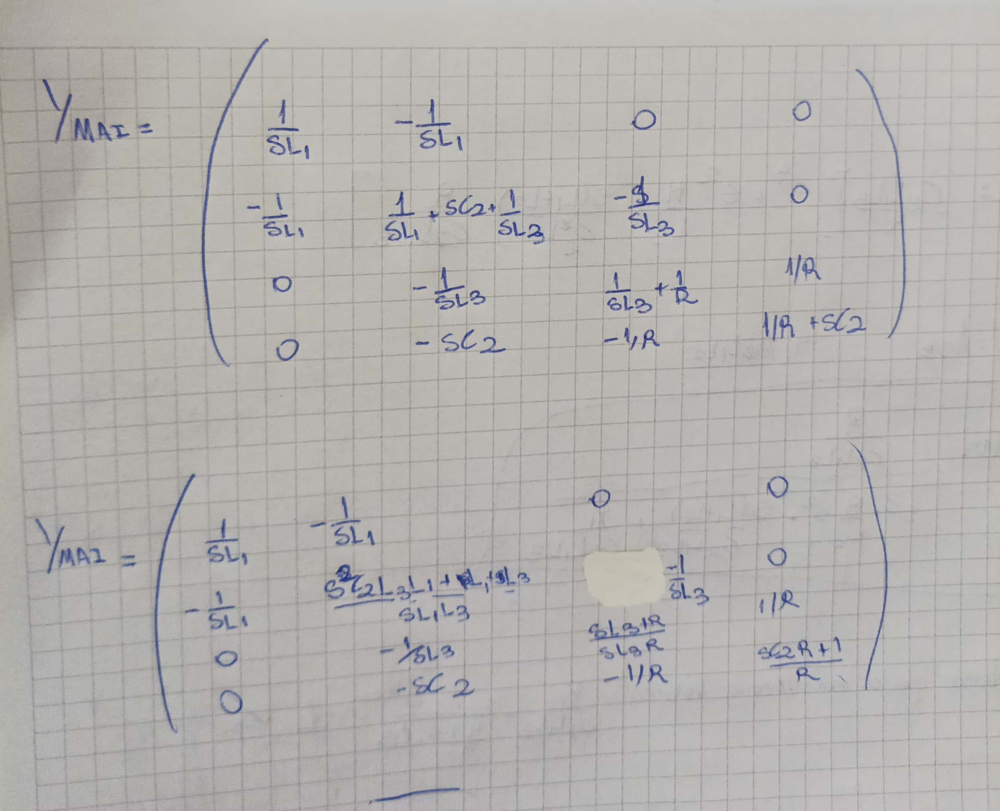

In [16]:



import numpy as np
import scipy.signal as sig
import splane as tc2
import matplotlib.pyplot as plt



import sympy as sp
from splane import print_latex, calc_MAI_impedance_ij, calc_MAI_vtransf_ij_mn, calc_MAI_ztransf_ij_mn


# T puenteado cargado: red de R constante
# explicación:
'''    
+ Numeramos los polos de 0 a n=3

            
    0-------+--Ya---1---Yc---2
                    |       |
                   Yb       G
                    |       |
    3---------------+--------
    
'''    

Ya, Yb, Yc= sp.symbols('Ya Yb Yc', complex=True)
G = sp.symbols('G', real=True, positive=True)

# Armo la MAI

#               Nodos: 0      1        2        3
Ymai = sp.Matrix([  
                    [ Ya,   -Ya,      0,     0],
                    [ -Ya,     Ya + Yb + Yc,    -Yc,    -Yb],
                    [ 0,   -Yc,      Yc + G, -G],
                    [ 0,   -Yb,     -G,     G  + Yb ]
                 ])

# con_detalles = False
con_detalles = True



print('Transferencia de tensión:')
Vmai = calc_MAI_vtransf_ij_mn(Ymai, 2, 3, 0, 3, verbose=con_detalles)


print_latex( r'T^{{ {:d}{:d} }}_{{ {:d}{:d} }} = '.format(2, 3, 0, 3) )



Transferencia de tensión:


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

Realizamos la verificacion para ver que efectivamente nos haya dado igual que de forma analitica

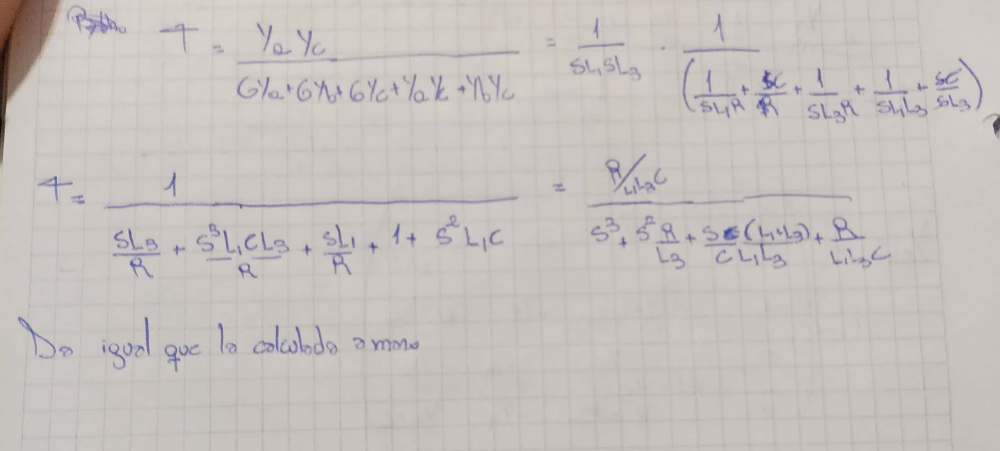

Tambien muestro que en la simulacion circuital se comporta con un pasa bajos y que tiene los palos en un radio unitario como lo dice la consigna

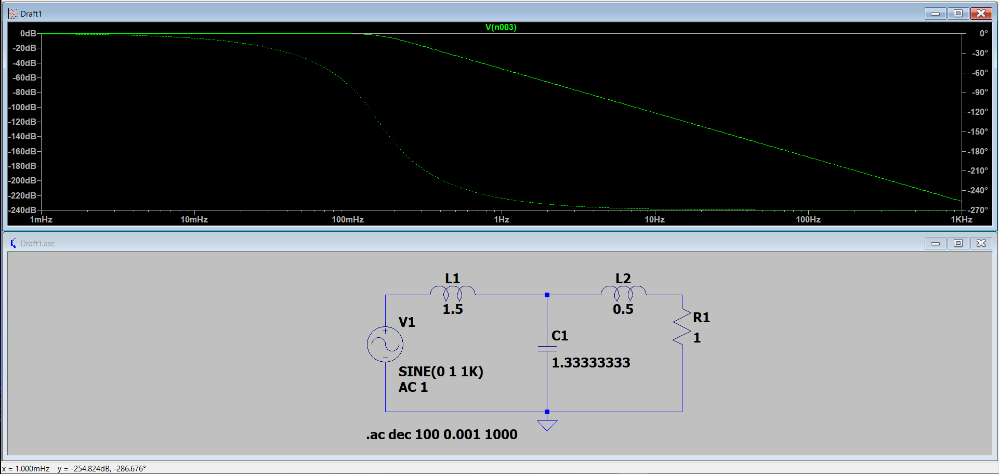

# Parte 2  
# Ejercico 2

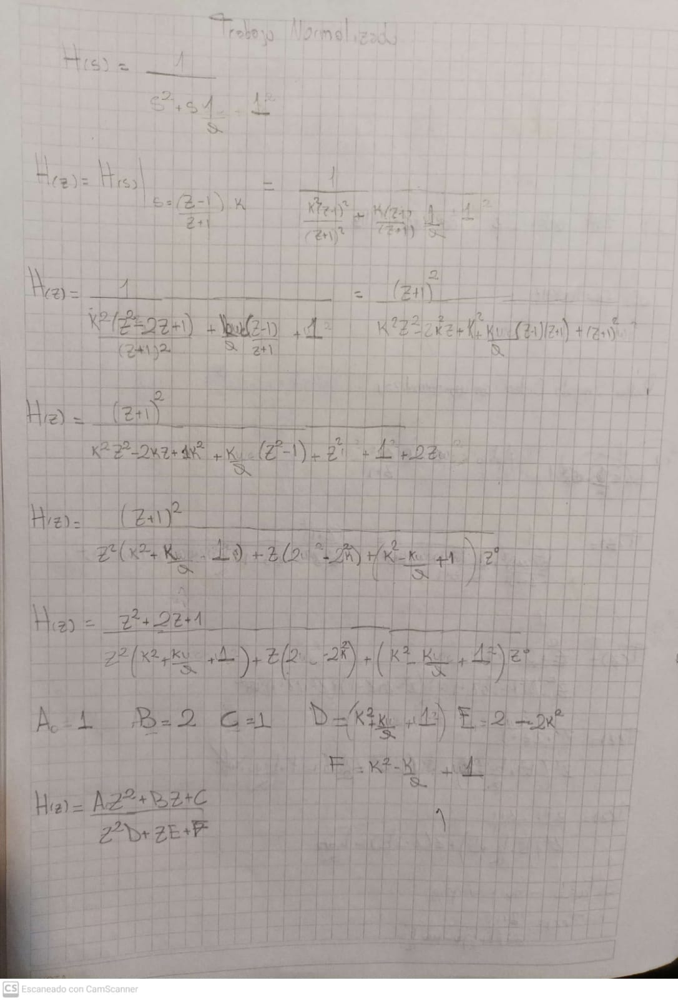

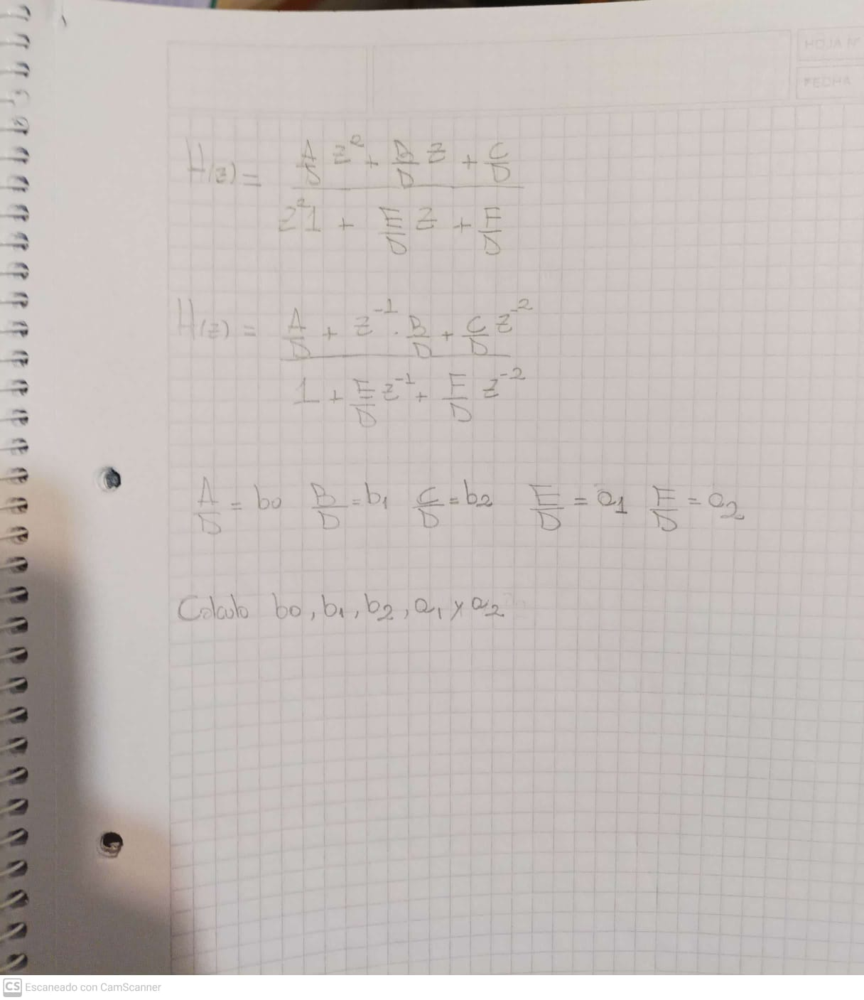

Primer caso para fc= 1k y fs=100k

In [13]:
import numpy as np
import scipy.signal as sig
import matplotlib.pyplot as plt

fc = 1e3
fs = 100e3
xlim1=0
xlim2=10
ylim1=-6
ylim2=4
    
WN = int(5*10e3) # Cantidad de puntos para la funcion Freqz
KHz = 1000
  # Frecuencia de corte del filtro
  # fc = 1e3
wc = 2*np.pi*fc
  # Frecuencia de Sampling
  # fs = 100e3
nq = fs/2
#  ws = 2*np.pi*fs
  
#Normalizacion de las Fs
fs_n = fs/wc
#ws_n = ws/W_fc
  
  # K de transormada Bilineal
K = 2*fs_n
  # Q de Butter Orden 2
Q = np.sqrt(2)/2
  
  # Coeficientes desnormalizados
A = 1
B = 2
C = 1
  
D= K**2 + K/Q + 1
E = 2 - 2*K
F = K**2 - K/Q + 1
  
  
  
  #Coeficientes normalizados
a0 = 1
a1 = E/D
a2 = F/D
  
b0 = A/D
b1 = B/D
b2 = C/D

print ("a0", a0)
print ("a1", a1)
print ("a2", a2)
print ("b0", b0)
print ("b1", b1)
print ("b2", b2)

a0 1
a1 -0.05821409317144329
a2 0.9150025667984956
b0 0.0009440841143955487
b1 0.0018881682287910974
b2 0.0009440841143955487


Ahora realizamos la simulacion

(-60.0, 4.0)

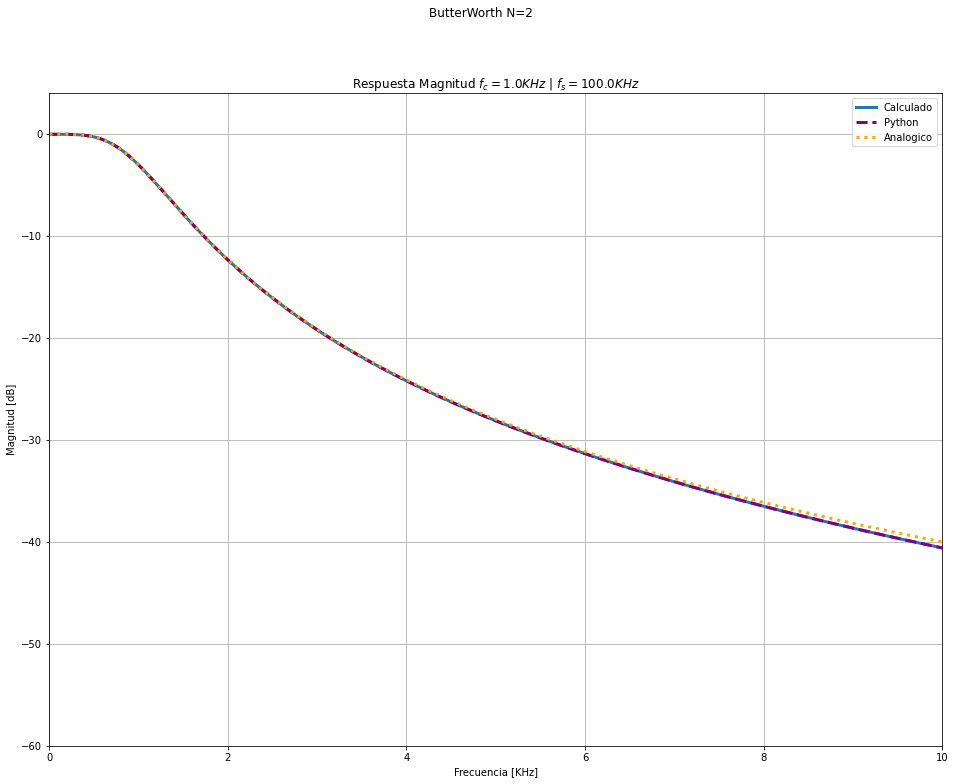

In [5]:
numz = [b0, b1, b2]
denz = [a0, a1, a2]
  
w, h = sig.freqz(numz,denz,WN)
  
  # simulacion python
num_lp = [0,  0,  1]
den_lp = [1, 1/Q, 1]
  
numz_py, denz_py = sig.bilinear(num_lp, den_lp, fs_n) 
w_py, h_py = sig.freqz(numz_py,denz_py,WN)
  
  # filtro analogico
  # w_analog, h_analog = sig.freqs(num_lp,den_lp)
w_analog, h_analog = sig.freqs(num_lp,den_lp,  worN=np.logspace(-3, 2, 1000))
h_analog_db    = 20*np.log10(np.maximum(np.abs(h_analog), 1e-4))
  
h_db    = 20*np.log10(np.maximum(np.abs(h), 1e-4))
h_db_py = 20*np.log10(np.maximum(np.abs(h_py), 1e-4))
  
  # Grafico
fig, ax = plt.subplots(nrows=1, ncols=1, sharex=True)
fig.set_size_inches(16,12)
  # MODULO
fig.suptitle('ButterWorth N=2')
ax.plot(w*nq/(np.pi*KHz), h_db,linewidth=3, label = 'Calculado')
ax.plot(w_py*nq/(np.pi*KHz), h_db_py,color='purple',linestyle='dashed',linewidth=3, label = 'Python')
ax.plot(w_analog*fc/KHz, h_analog_db, color = 'orange',linestyle=':',  linewidth=3, label = 'Analogico')
ax.grid(True)
ax.set_title('Respuesta Magnitud $f_c = {} KHz$ | $f_s = {}KHz$'.format(fc/KHz, fs/KHz))
ax.set_ylabel('Magnitud [dB]')
ax.set_xlabel('Frecuencia [KHz]')
ax.legend()
ax.set_xlim([xlim1, xlim2])
ax.set_ylim([ylim1, ylim2])

# B

Para fs = 10k 

a0 1
a1 -0.27928115155279204
a2 0.42411820661561633
b0 0.063964384855588
b1 0.127928769711176
b2 0.063964384855588


(-5.0, 1.0)

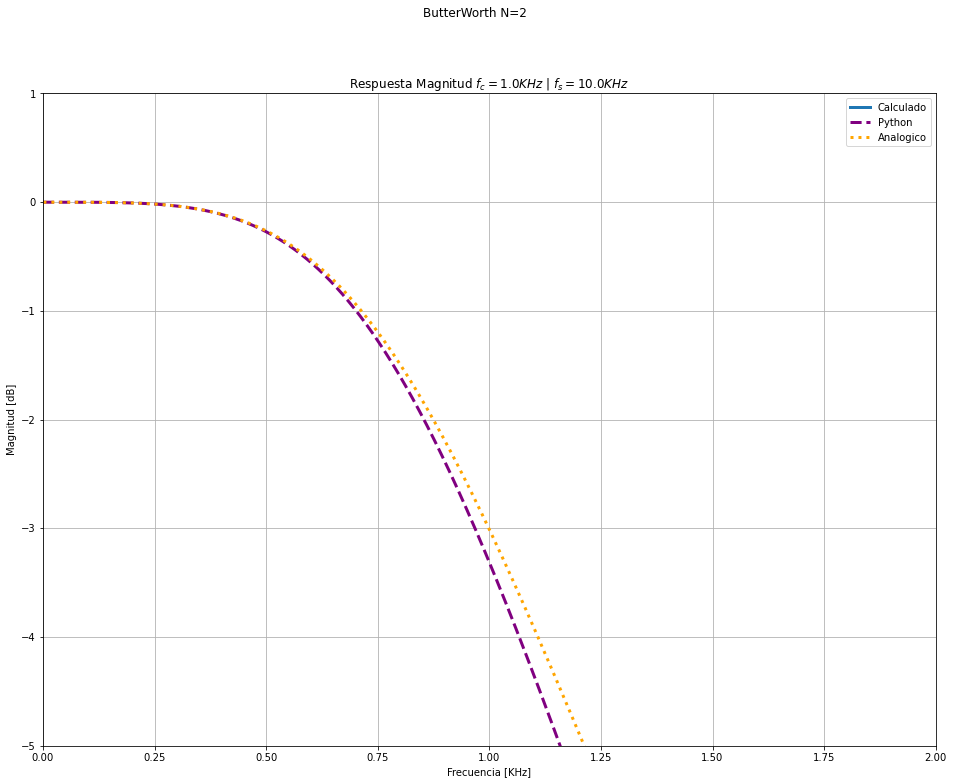

In [11]:
import numpy as np
import scipy.signal as sig
import matplotlib.pyplot as plt

fc = 1e3
fs = 10e3
xlim1=0
xlim2=2
ylim1=-5
ylim2=1
    
WN = int(5*10e3) # Cantidad de puntos para la funcion Freqz
KHz = 1000
  # Frecuencia de corte del filtro
  # fc = 1e3
wc = 2*np.pi*fc
  # Frecuencia de Sampling
  # fs = 100e3
nq = fs/2
#  ws = 2*np.pi*fs
  
#Normalizacion de las Fs
fs_n = fs/wc
#ws_n = ws/W_fc
  
  # K de transormada Bilineal
K = 2*fs_n
  # Q de Butter Orden 2
Q = np.sqrt(2)/2
  
  # Coeficientes desnormalizados
A = 1
B = 2
C = 1
  
D= K**2 + K/Q + 1
E = 2 - 2*K
F = K**2 - K/Q + 1
  
  
  
  #Coeficientes normalizados
a0 = 1
a1 = E/D
a2 = F/D
  
b0 = A/D
b1 = B/D
b2 = C/D

print ("a0", a0)
print ("a1", a1)
print ("a2", a2)
print ("b0", b0)
print ("b1", b1)
print ("b2", b2)

numz = [b0, b1, b2]
denz = [a0, a1, a2]
  
w, h = sig.freqz(numz,denz,WN)
  
  # simulacion python
num_lp = [0,  0,  1]
den_lp = [1, 1/Q, 1]
  
numz_py, denz_py = sig.bilinear(num_lp, den_lp, fs_n) 
w_py, h_py = sig.freqz(numz_py,denz_py,WN)
  
  # filtro analogico
  # w_analog, h_analog = sig.freqs(num_lp,den_lp)
w_analog, h_analog = sig.freqs(num_lp,den_lp,  worN=np.logspace(-3, 2, 1000))
h_analog_db    = 20*np.log10(np.maximum(np.abs(h_analog), 1e-4))
  
h_db    = 20*np.log10(np.maximum(np.abs(h), 1e-4))
h_db_py = 20*np.log10(np.maximum(np.abs(h_py), 1e-4))
  
  # Grafico
fig, ax = plt.subplots(nrows=1, ncols=1, sharex=True)
fig.set_size_inches(16,12)
  # MODULO
fig.suptitle('ButterWorth N=2')
ax.plot(w*nq/(np.pi*KHz), h_db,linewidth=3, label = 'Calculado')
ax.plot(w_py*nq/(np.pi*KHz), h_db_py,color='purple',linestyle='dashed',linewidth=3, label = 'Python')
ax.plot(w_analog*fc/KHz, h_analog_db, color = 'orange',linestyle=':',  linewidth=3, label = 'Analogico')
ax.grid(True)
ax.set_title('Respuesta Magnitud $f_c = {} KHz$ | $f_s = {}KHz$'.format(fc/KHz, fs/KHz))
ax.set_ylabel('Magnitud [dB]')
ax.set_xlabel('Frecuencia [KHz]')
ax.legend()
ax.set_xlim([xlim1, xlim2])
ax.set_ylim([ylim1, ylim2])

Para fc = 6k y fs=100k

a0 1
a1 -0.23495056613714224
a2 0.5905502663705401
b0 0.027287058533637228
b1 0.054574117067274455
b2 0.027287058533637228


(-6.0, 1.0)

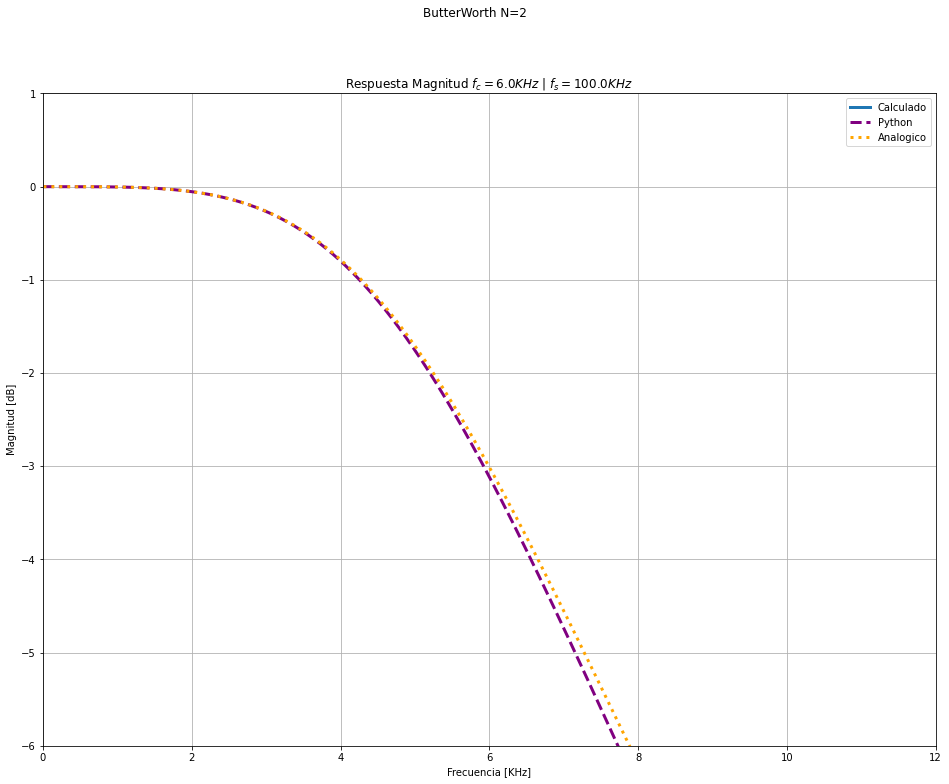

In [12]:
import numpy as np
import scipy.signal as sig
import matplotlib.pyplot as plt

fc = 6e3
fs = 100e3
xlim1=0
xlim2=12
ylim1=-6
ylim2=1
    
WN = int(5*10e3) # Cantidad de puntos para la funcion Freqz
KHz = 1000
  # Frecuencia de corte del filtro
  # fc = 1e3
wc = 2*np.pi*fc
  # Frecuencia de Sampling
  # fs = 100e3
nq = fs/2
#  ws = 2*np.pi*fs
  
#Normalizacion de las Fs
fs_n = fs/wc
#ws_n = ws/W_fc
  
  # K de transormada Bilineal
K = 2*fs_n
  # Q de Butter Orden 2
Q = np.sqrt(2)/2
  
  # Coeficientes desnormalizados
A = 1
B = 2
C = 1
  
D= K**2 + K/Q + 1
E = 2 - 2*K
F = K**2 - K/Q + 1
  
  
  
  #Coeficientes normalizados
a0 = 1
a1 = E/D
a2 = F/D
  
b0 = A/D
b1 = B/D
b2 = C/D

print ("a0", a0)
print ("a1", a1)
print ("a2", a2)
print ("b0", b0)
print ("b1", b1)
print ("b2", b2)

numz = [b0, b1, b2]
denz = [a0, a1, a2]
  
w, h = sig.freqz(numz,denz,WN)
  
  # simulacion python
num_lp = [0,  0,  1]
den_lp = [1, 1/Q, 1]
  
numz_py, denz_py = sig.bilinear(num_lp, den_lp, fs_n) 
w_py, h_py = sig.freqz(numz_py,denz_py,WN)
  
  # filtro analogico
  # w_analog, h_analog = sig.freqs(num_lp,den_lp)
w_analog, h_analog = sig.freqs(num_lp,den_lp,  worN=np.logspace(-3, 2, 1000))
h_analog_db    = 20*np.log10(np.maximum(np.abs(h_analog), 1e-4))
  
h_db    = 20*np.log10(np.maximum(np.abs(h), 1e-4))
h_db_py = 20*np.log10(np.maximum(np.abs(h_py), 1e-4))
  
  # Grafico
fig, ax = plt.subplots(nrows=1, ncols=1, sharex=True)
fig.set_size_inches(16,12)
  # MODULO
fig.suptitle('ButterWorth N=2')
ax.plot(w*nq/(np.pi*KHz), h_db,linewidth=3, label = 'Calculado')
ax.plot(w_py*nq/(np.pi*KHz), h_db_py,color='purple',linestyle='dashed',linewidth=3, label = 'Python')
ax.plot(w_analog*fc/KHz, h_analog_db, color = 'orange',linestyle=':',  linewidth=3, label = 'Analogico')
ax.grid(True)
ax.set_title('Respuesta Magnitud $f_c = {} KHz$ | $f_s = {}KHz$'.format(fc/KHz, fs/KHz))
ax.set_ylabel('Magnitud [dB]')
ax.set_xlabel('Frecuencia [KHz]')
ax.legend()
ax.set_xlim([xlim1, xlim2])
ax.set_ylim([ylim1, ylim2])

fs=10k fc=6k

a0 1
a1 0.4621557366875931
a2 0.2614466572708233
b0 0.4921959067996931
b1 0.9843918135993862
b2 0.4921959067996931


(-6.0, 1.0)

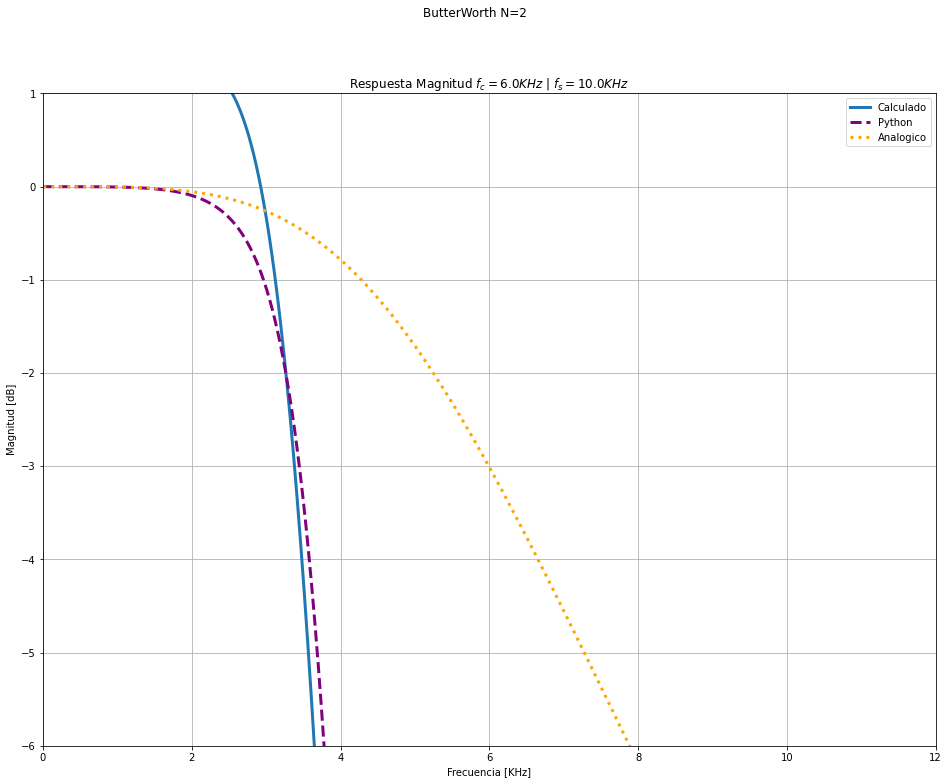

In [14]:
import numpy as np
import scipy.signal as sig
import matplotlib.pyplot as plt

fc = 6e3
fs = 10e3
xlim1=0
xlim2=12
ylim1=-6
ylim2=1
    
WN = int(5*10e3) # Cantidad de puntos para la funcion Freqz
KHz = 1000
  # Frecuencia de corte del filtro
  # fc = 1e3
wc = 2*np.pi*fc
  # Frecuencia de Sampling
  # fs = 100e3
nq = fs/2
#  ws = 2*np.pi*fs
  
#Normalizacion de las Fs
fs_n = fs/wc
#ws_n = ws/W_fc
  
  # K de transormada Bilineal
K = 2*fs_n
  # Q de Butter Orden 2
Q = np.sqrt(2)/2
  
  # Coeficientes desnormalizados
A = 1
B = 2
C = 1
  
D= K**2 + K/Q + 1
E = 2 - 2*K
F = K**2 - K/Q + 1
  
  
  
  #Coeficientes normalizados
a0 = 1
a1 = E/D
a2 = F/D
  
b0 = A/D
b1 = B/D
b2 = C/D

print ("a0", a0)
print ("a1", a1)
print ("a2", a2)
print ("b0", b0)
print ("b1", b1)
print ("b2", b2)

numz = [b0, b1, b2]
denz = [a0, a1, a2]
  
w, h = sig.freqz(numz,denz,WN)
  
  # simulacion python
num_lp = [0,  0,  1]
den_lp = [1, 1/Q, 1]
  
numz_py, denz_py = sig.bilinear(num_lp, den_lp, fs_n) 
w_py, h_py = sig.freqz(numz_py,denz_py,WN)
  
  # filtro analogico
  # w_analog, h_analog = sig.freqs(num_lp,den_lp)
w_analog, h_analog = sig.freqs(num_lp,den_lp,  worN=np.logspace(-3, 2, 1000))
h_analog_db    = 20*np.log10(np.maximum(np.abs(h_analog), 1e-4))
  
h_db    = 20*np.log10(np.maximum(np.abs(h), 1e-4))
h_db_py = 20*np.log10(np.maximum(np.abs(h_py), 1e-4))
  
  # Grafico
fig, ax = plt.subplots(nrows=1, ncols=1, sharex=True)
fig.set_size_inches(16,12)
  # MODULO
fig.suptitle('ButterWorth N=2')
ax.plot(w*nq/(np.pi*KHz), h_db,linewidth=3, label = 'Calculado')
ax.plot(w_py*nq/(np.pi*KHz), h_db_py,color='purple',linestyle='dashed',linewidth=3, label = 'Python')
ax.plot(w_analog*fc/KHz, h_analog_db, color = 'orange',linestyle=':',  linewidth=3, label = 'Analogico')
ax.grid(True)
ax.set_title('Respuesta Magnitud $f_c = {} KHz$ | $f_s = {}KHz$'.format(fc/KHz, fs/KHz))
ax.set_ylabel('Magnitud [dB]')
ax.set_xlabel('Frecuencia [KHz]')
ax.legend()
ax.set_xlim([xlim1, xlim2])
ax.set_ylim([ylim1, ylim2])

# D

El prewarping es mas util en el ultimo caso. Se puede ver que es el caso donde tenemos mas diferencia con el filtro analogico, esto se debe a que no cumplimos con nyquist y tenemos aliasing

# Ejercicio 3

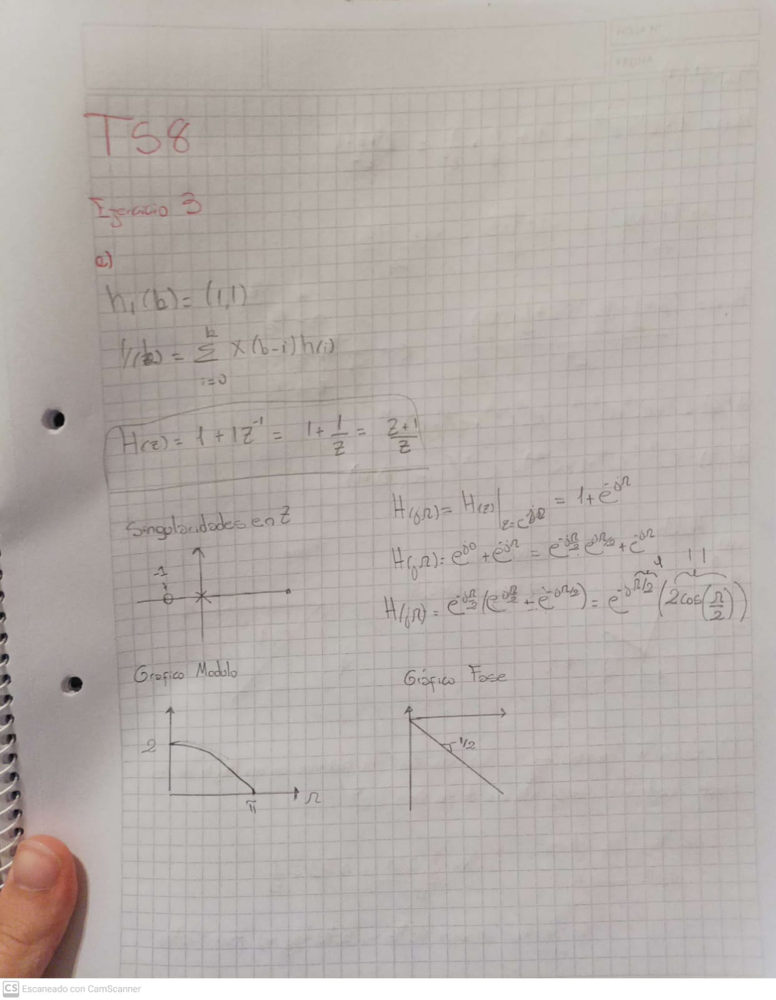
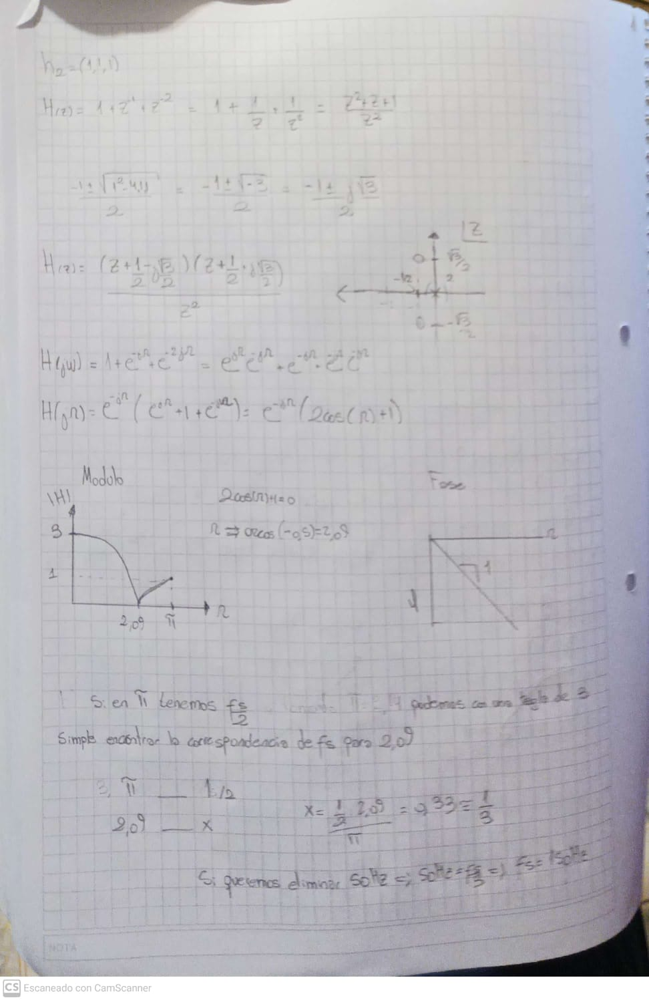

Para que sean de media aritmetica la suma de las respuestas al impulso debe dar uno. Para el primer caso seria 0.5 ambos coeficientes y para el segundo 1/3

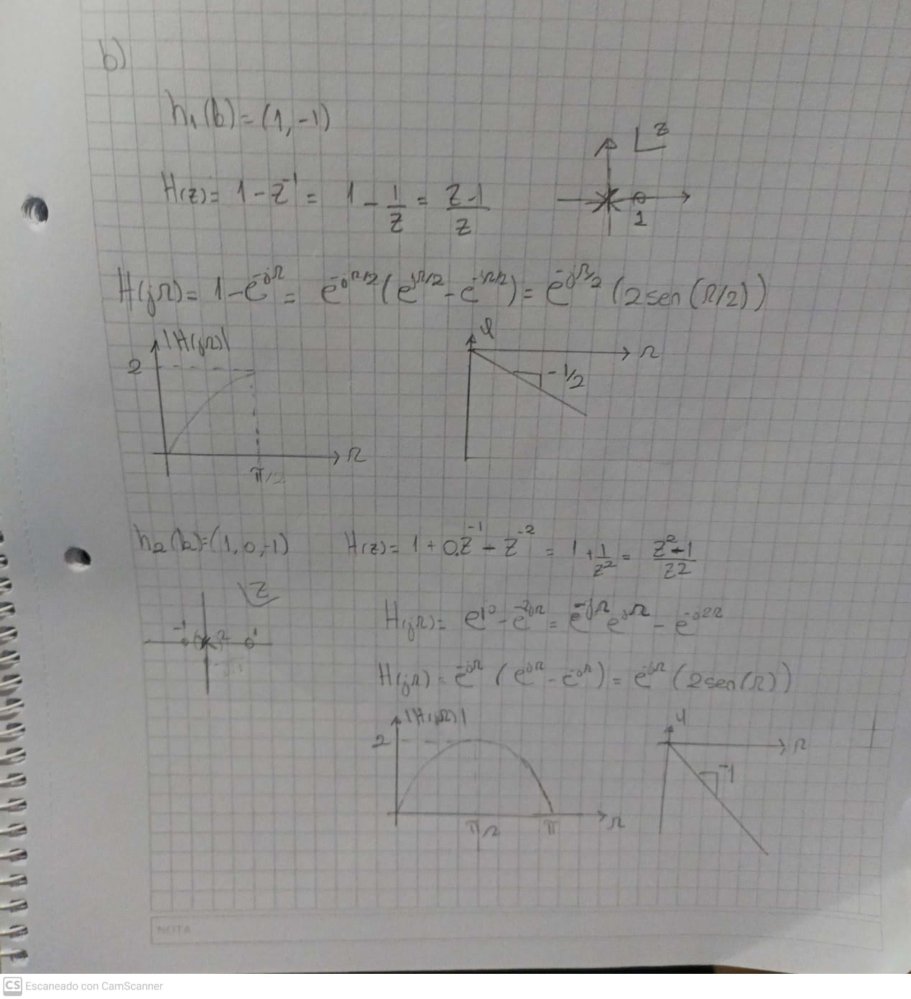

La demora que meten en la derivada de la fase cambiada de signo. Entonces la primera situacion suma una demora constante de 1/2 mientras que la segunda de 1